In [127]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBClassifier

from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, confusion_matrix, roc_curve
)

# Load Dataset

In [130]:
# Load dataset
df = pd.read_csv('Churn_Modelling.csv')

In [132]:
df.head()

,RowNumber,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,1,15634602,Hargrave,619,France,Female,42,2,0.00,1,1,1,101348.88,1
1,2,15647311,Hill,608,Spain,Female,41,1,83807.86,1,0,1,112542.58,0
2,3,15619304,Onio,502,France,Female,42,8,159660.80,3,1,0,113931.57,1
3,4,15701354,Boni,699,France,Female,39,1,0.00,2,0,0,93826.63,0
4,5,15737888,Mitchell,850,Spain,Female,43,2,125510.82,1,1,1,79084.10,0


In [134]:
df.shape

(10000, 14)

# Data Cleaning

In [137]:
df.isna().sum()

RowNumber          0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

In [139]:
df.columns 

Index(['RowNumber', 'CustomerId', 'Surname', 'CreditScore', 'Geography',
       'Gender', 'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

# Data Stats and Distribution

In [142]:
df.describe()

,RowNumber,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,10000.00000,1.000000e+04,10000.000000,10000.000000,10000.000000,10000.000000,10000.000000,10000.00000,10000.000000,10000.000000,10000.000000
mean,5000.50000,1.569094e+07,650.528800,38.921800,5.012800,76485.889288,1.530200,0.70550,0.515100,100090.239881,0.203700
std,2886.89568,7.193619e+04,96.653299,10.487806,2.892174,62397.405202,0.581654,0.45584,0.499797,57510.492818,0.402769
min,1.00000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.00000,0.000000,11.580000,0.000000
25%,2500.75000,1.562853e+07,584.000000,32.000000,3.000000,0.000000,1.000000,0.00000,0.000000,51002.110000,0.000000
50%,5000.50000,1.569074e+07,652.000000,37.000000,5.000000,97198.540000,1.000000,1.00000,1.000000,100193.915000,0.000000
75%,7500.25000,1.575323e+07,718.000000,44.000000,7.000000,127644.240000,2.000000,1.00000,1.000000,149388.247500,0.000000
max,10000.00000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.00000,1.000000,199992.480000,1.000000


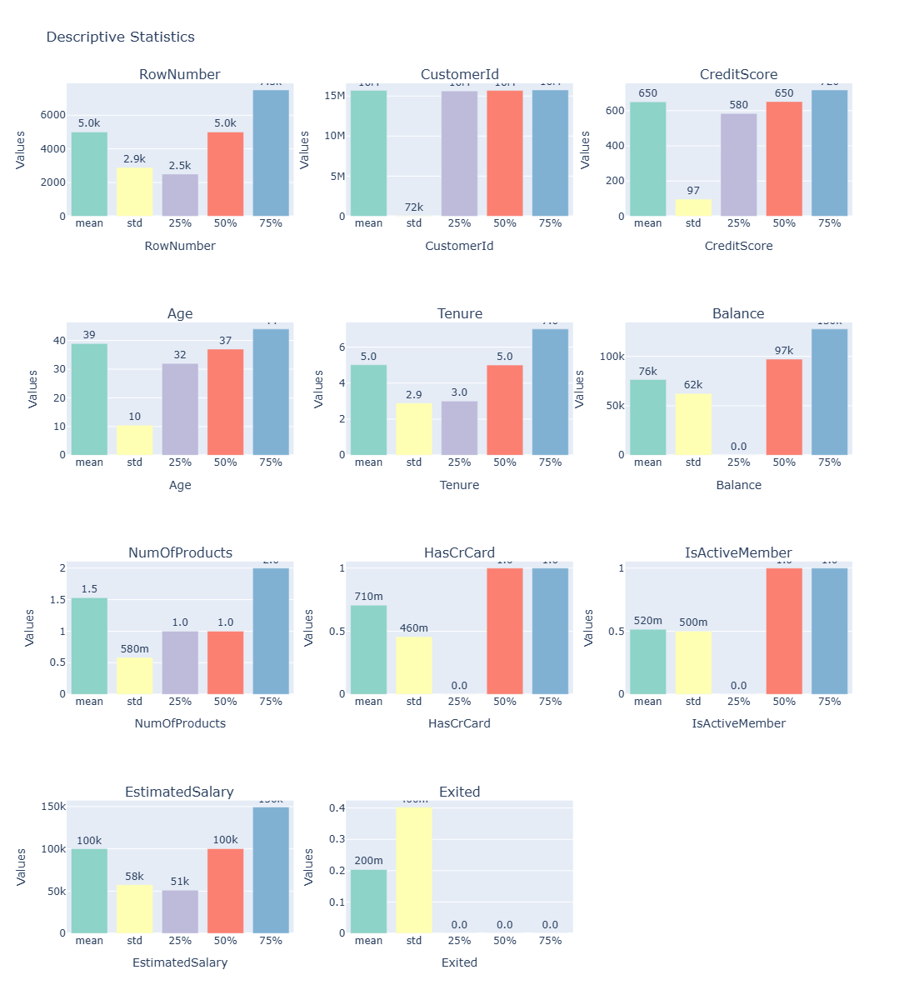

In [144]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px

all_column_stats = df.describe()
all_column_stats = all_column_stats.drop(['count', 'min', 'max'])

num_columns = len(all_column_stats.columns)
num_rows = (num_columns - 1) // 3 + 1

fig = make_subplots(rows=num_rows, cols=3, subplot_titles=all_column_stats.columns)

for i, column in enumerate(all_column_stats.columns):
    row_num = i // 3 + 1
    col_num = i % 3 + 1
    column_stats = all_column_stats[column]
    fig.add_trace(
        go.Bar(
            x=column_stats.index,
            y=column_stats.values,
            marker_color=px.colors.qualitative.Set3,
            texttemplate='%{y:.2s}',
            textposition='outside',
        ),
        row=row_num,
        col=col_num,
    )
    fig.update_xaxes(title_text=column, row=row_num, col=col_num)
    fig.update_yaxes(title_text='Values', row=row_num, col=col_num)

fig.update_layout(showlegend=False, height=300 * num_rows, width=900, title_text="Descriptive Statistics")
fig.show()

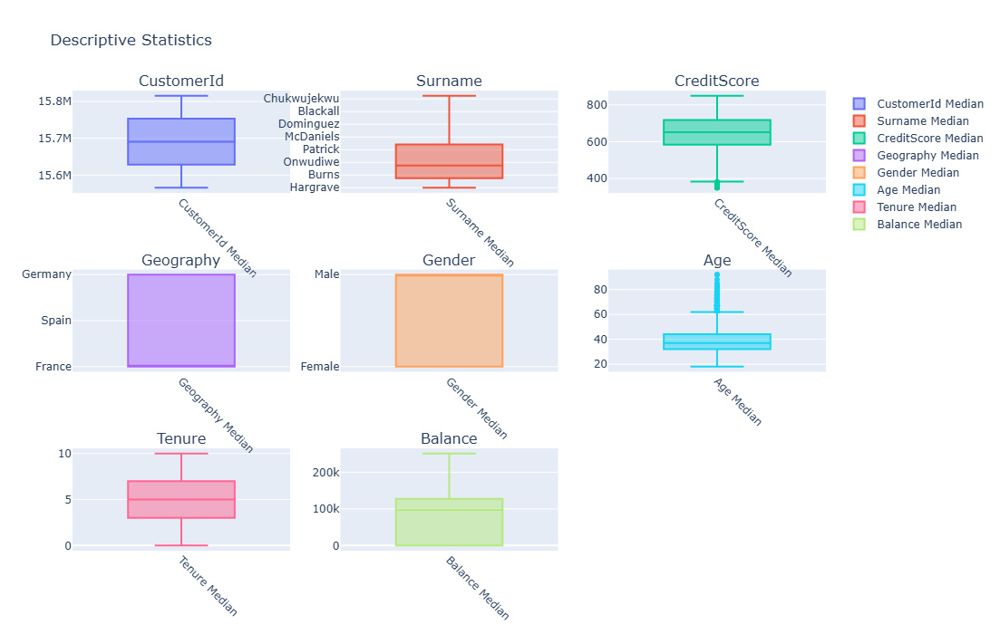

In [146]:
columns = list(df.columns)[1:9]
fig = make_subplots(rows=3, cols=3, subplot_titles=[f'{column}' for column in columns])
for i, column in enumerate(columns):
    row, col = divmod(i, 3) 
    box_plot = go.Box(y=df[column], name=f'{column} Median')
    fig.add_trace(box_plot, row=row + 1, col=col + 1)

fig.update_layout(height=700, width=950, title_text="Descriptive Statistics")
fig.update_xaxes(tickangle=45)  
fig.show()

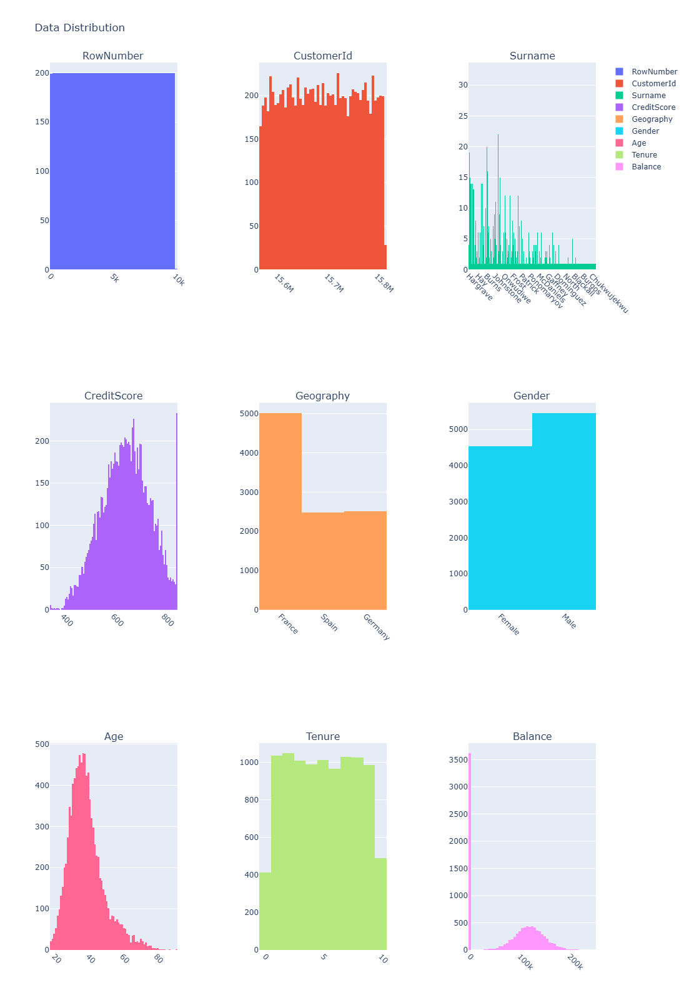

In [148]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots

columns = list(df.columns)[:9]
subplot_titles = [f'{column}' for column in columns]

fig = make_subplots(rows=3, cols=3, subplot_titles=subplot_titles, vertical_spacing=0.15, horizontal_spacing=0.15)
for i, column in enumerate(columns):
    row, col = divmod(i, 3)  
    histogram = go.Histogram(x=df[column], name=column)
    fig.add_trace(histogram, row=row + 1, col=col + 1)

fig.update_layout(height=1600, width=950, title_text="Data Distribution")
fig.update_xaxes(tickangle=45)  
fig.show()

C:\Users\Mohd Umar\AppData\Local\Temp\ipykernel_14188\1786787632.py:3: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




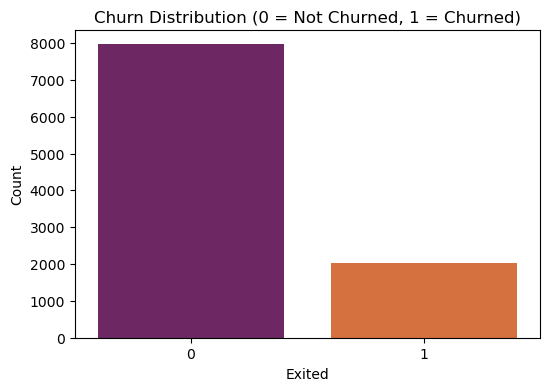

In [177]:
# Plot Churn Distribution
plt.figure(figsize=(6,4))
sns.countplot(x='Exited', data=df, palette='inferno')
plt.title('Churn Distribution (0 = Not Churned, 1 = Churned)')
plt.xlabel('Exited')
plt.ylabel('Count')
plt.show()

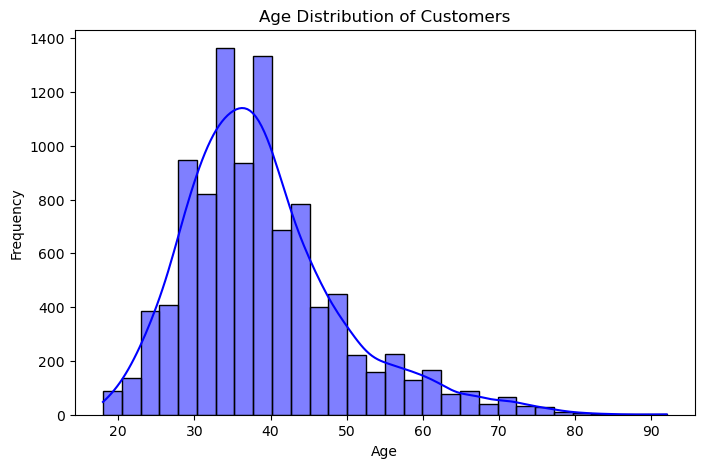

In [179]:
plt.figure(figsize=(8,5))
sns.histplot(df['Age'], bins=30, kde=True, color='blue')
plt.title('Age Distribution of Customers')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

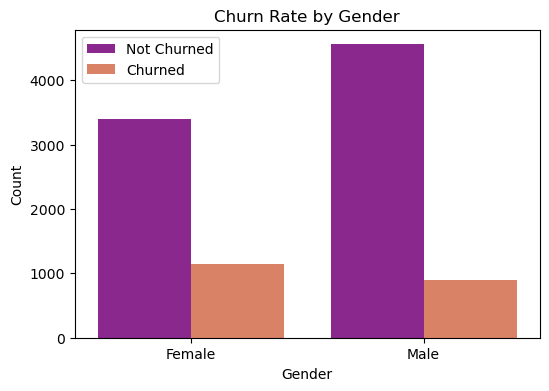

In [189]:
plt.figure(figsize=(6,4))
sns.countplot(x='Gender', hue='Exited', data=df, palette='plasma')
plt.title('Churn Rate by Gender')
plt.xlabel('Gender')
plt.ylabel('Count')
plt.legend(['Not Churned', 'Churned'])
plt.show()

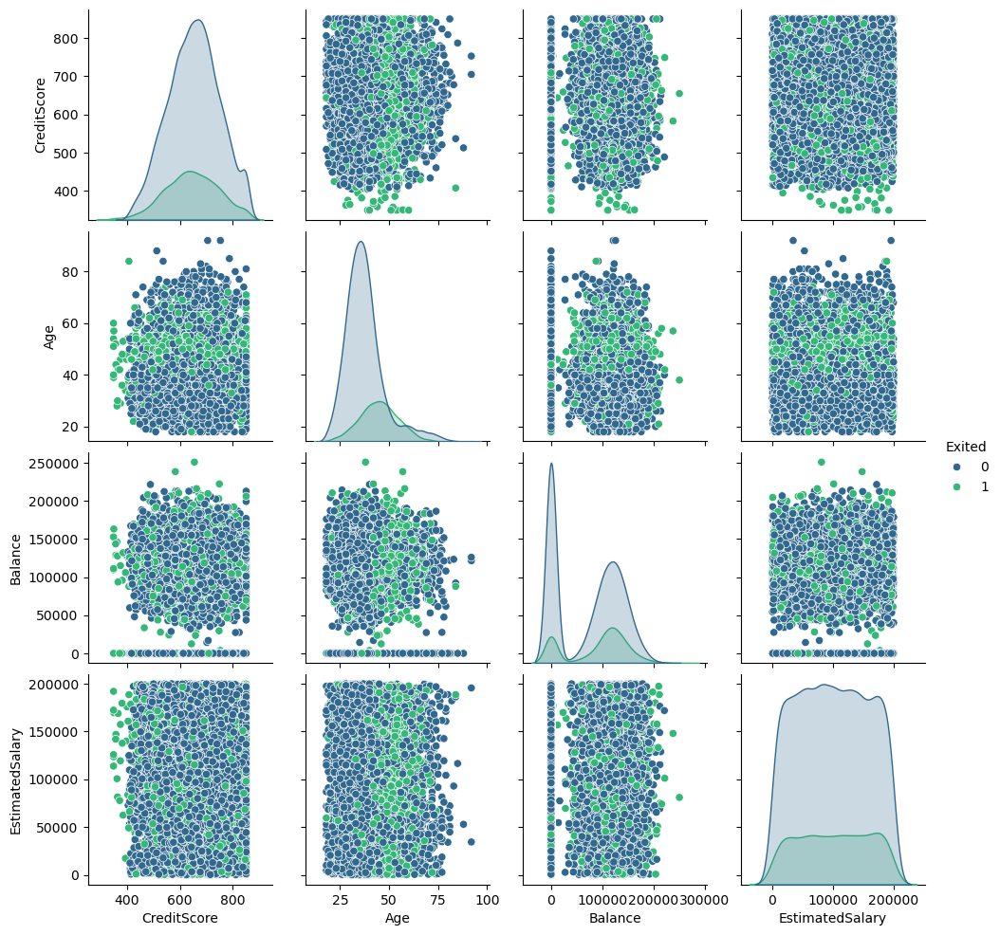

In [187]:
sns.pairplot(df[['CreditScore', 'Age', 'Balance', 'EstimatedSalary', 'Exited']], hue='Exited', palette='viridis')
plt.show()

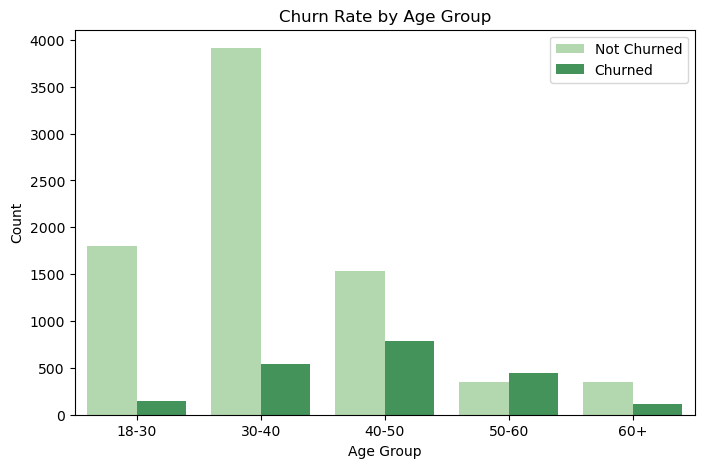

In [195]:
df['Age_Group'] = pd.cut(df['Age'], bins=[18, 30, 40, 50, 60, 100], labels=['18-30', '30-40', '40-50', '50-60', '60+'])

plt.figure(figsize=(8,5))
sns.countplot(x='Age_Group', hue='Exited', data=df, palette='Greens')
plt.title('Churn Rate by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Count')
plt.legend(['Not Churned', 'Churned'])
plt.show()

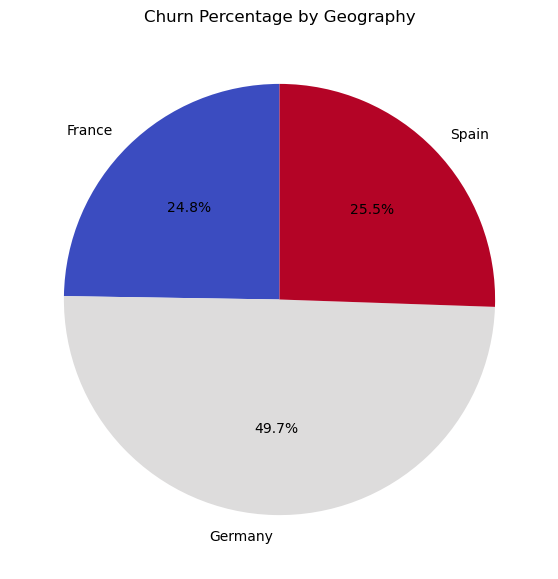

In [205]:
plt.figure(figsize=(7,7))
df_geo = df.groupby('Geography')['Exited'].mean() * 100
df_geo.plot.pie(autopct="%1.1f%%", cmap='coolwarm', startangle=90)
plt.title("Churn Percentage by Geography")
plt.ylabel("")  # Remove y-label
plt.show()

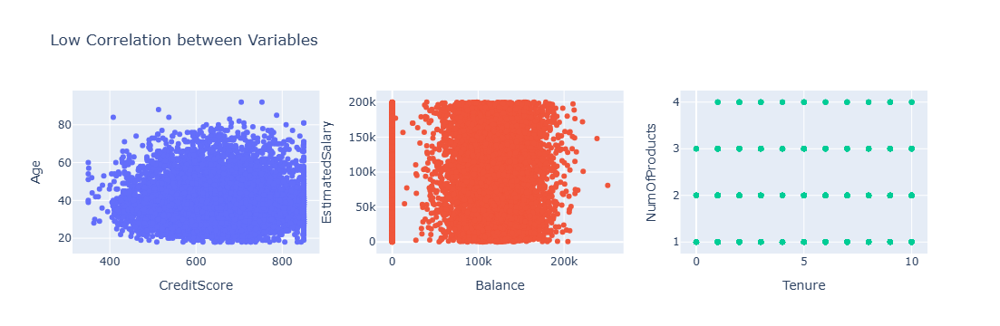

In [167]:
import plotly.subplots as sp
# Example list of low-correlation pairs (Replace with actual pairs from correlation analysis)
low_correlation_pairs_list = [("CreditScore", "Age"), ("Balance", "EstimatedSalary"), ("Tenure", "NumOfProducts")]

# Create subplot grid
fig = sp.make_subplots(rows=1, cols=3)

# Iterate over each subplot and scatter column pair
for i, (col1, col2) in enumerate(low_correlation_pairs_list):
    row_num, col_num = divmod(i, 3)  # row_num = 0 always since rows=1
    scatter = go.Scatter(x=df[col1], y=df[col2], mode='markers', name=f'Trace {i+1}')
    fig.add_trace(scatter, row=row_num+1, col=col_num+1)

    # Update x and y axis titles for each subplot dynamically
    fig.update_xaxes(title_text=col1, row=row_num+1, col=col_num+1)
    fig.update_yaxes(title_text=col2, row=row_num+1, col=col_num+1)

# Layout settings
fig.update_layout(title_text="Low Correlation between Variables", showlegend=False, width=1300)
fig.show()

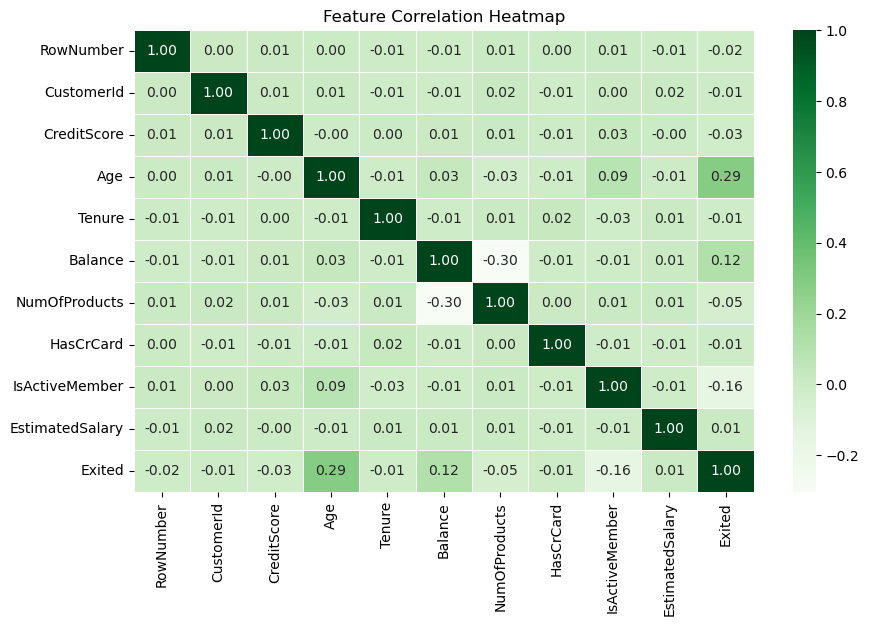

In [217]:
# Compute correlation matrix (only for numerical features)
corr_matrix = df.select_dtypes(include=["number"]).corr()

# Plot the heatmap
plt.figure(figsize=(10,6))
sns.heatmap(corr_matrix, annot=True, fmt=".2f", cmap="Greens", linewidths=0.5)
plt.title("Feature Correlation Heatmap")
plt.show()

# Data Tranformation

In [63]:
# Drop non-feature columns if present
drop_cols = ['RowNumber', 'CustomerId', 'Surname']
df.drop(columns=[col for col in drop_cols if col in df.columns], inplace=True)

In [65]:
# Encode binary object columns
le = LabelEncoder()
for col in df.select_dtypes(include='object').columns:
    if df[col].nunique() == 2:
        df[col] = le.fit_transform(df[col])

In [67]:
df.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,619,France,0,42,2,0.00,1,1,1,101348.88,1
1,608,Spain,0,41,1,83807.86,1,0,1,112542.58,0
2,502,France,0,42,8,159660.80,3,1,0,113931.57,1
3,699,France,0,39,1,0.00,2,0,0,93826.63,0
4,850,Spain,0,43,2,125510.82,1,1,1,79084.10,0


In [69]:
# One-hot encode categorical variables with > 2 categories
df = pd.get_dummies(df, drop_first=True)

In [71]:
# Handle missing values (important!)
df.fillna(df.median(numeric_only=True), inplace=True)

In [73]:
# Define features and target
target = 'Exited'  # Update if different
X = df.drop(target, axis=1)
y = df[target]

In [75]:
# Split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Scale features
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

# Logistic Regression Model

In [78]:
lr_model = LogisticRegression()
lr_model.fit(X_train, y_train)
y_pred_lr = lr_model.predict(X_test)
y_proba_lr = lr_model.predict_proba(X_test)[:, 1]

In [84]:
# Evaluation
from sklearn.metrics import classification_report

print("Logistic Regression Report:\n")
print(classification_report(y_test, y_pred_lr))
print("ROC AUC Score:", roc_auc_score(y_test, y_proba_lr))

Logistic Regression Report:

              precision    recall  f1-score   support

           0       0.83      0.96      0.89      1607
           1       0.55      0.20      0.29       393

    accuracy                           0.81      2000
   macro avg       0.69      0.58      0.59      2000
weighted avg       0.78      0.81      0.77      2000

ROC AUC Score: 0.7788998829864888


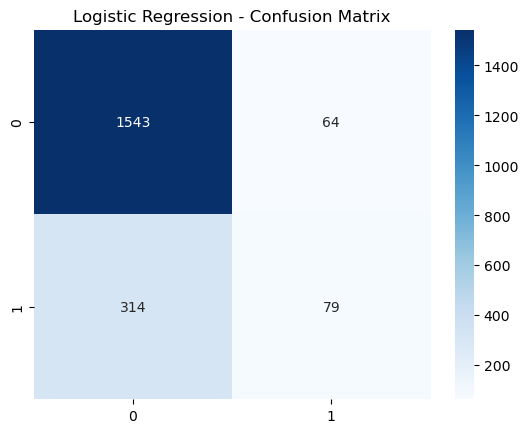

In [86]:
# Confusion Matrix
sns.heatmap(confusion_matrix(y_test, y_pred_lr), annot=True, fmt='d', cmap='Blues')
plt.title("Logistic Regression - Confusion Matrix")
plt.show()

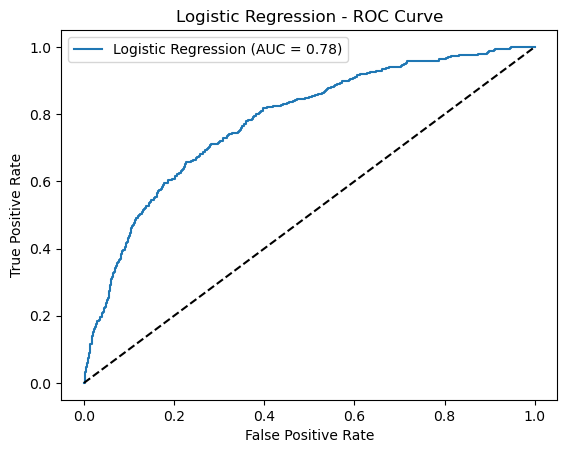

In [88]:
# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba_lr)
plt.plot(fpr, tpr, label='Logistic Regression (AUC = %.2f)' % roc_auc_score(y_test, y_proba_lr))
plt.plot([0, 1], [0, 1], 'k--')
plt.xlabel("False Positive Rate")
plt.ylabel("True Positive Rate")
plt.title("Logistic Regression - ROC Curve")
plt.legend()
plt.show()

# Decision Tree Classifier

In [91]:
dt_model = DecisionTreeClassifier()
dt_model.fit(X_train, y_train)
y_pred_dt = dt_model.predict(X_test)
y_proba_dt = dt_model.predict_proba(X_test)[:, 1]

In [93]:
# Evaluation
print("Decision Tree Report:\n")
print(classification_report(y_test, y_pred_dt))
print("ROC AUC Score:", roc_auc_score(y_test, y_proba_dt))

Decision Tree Report:

              precision    recall  f1-score   support

           0       0.87      0.85      0.86      1607
           1       0.45      0.50      0.47       393

    accuracy                           0.78      2000
   macro avg       0.66      0.68      0.67      2000
weighted avg       0.79      0.78      0.79      2000

ROC AUC Score: 0.675990537581288


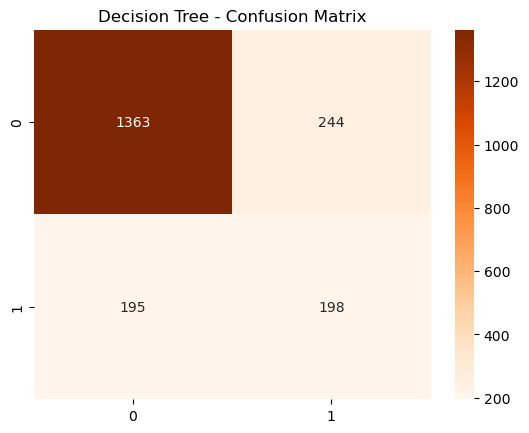

In [95]:
# Confusion Matrix
sns.heatmap(confusion_matrix(y_test, y_pred_dt), annot=True, fmt='d', cmap='Oranges')
plt.title("Decision Tree - Confusion Matrix")
plt.show()

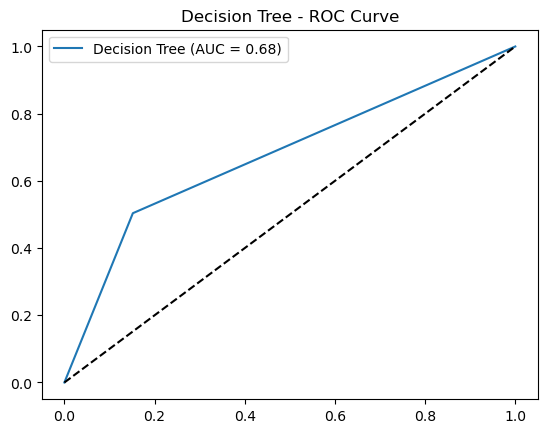

In [97]:
# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba_dt)
plt.plot(fpr, tpr, label='Decision Tree (AUC = %.2f)' % roc_auc_score(y_test, y_proba_dt))
plt.plot([0, 1], [0, 1], 'k--')
plt.title("Decision Tree - ROC Curve")
plt.legend()
plt.show()

# Random Forest Classifier

In [100]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
y_pred_rf = rf_model.predict(X_test)
y_proba_rf = rf_model.predict_proba(X_test)[:, 1]

In [101]:
# Evaluation
print("Random Forest Report:\n")
print(classification_report(y_test, y_pred_rf))
print("ROC AUC Score:", roc_auc_score(y_test, y_proba_rf))

Random Forest Report:

              precision    recall  f1-score   support

           0       0.88      0.96      0.92      1607
           1       0.75      0.46      0.57       393

    accuracy                           0.86      2000
   macro avg       0.81      0.71      0.75      2000
weighted avg       0.85      0.86      0.85      2000

ROC AUC Score: 0.8576116576491843


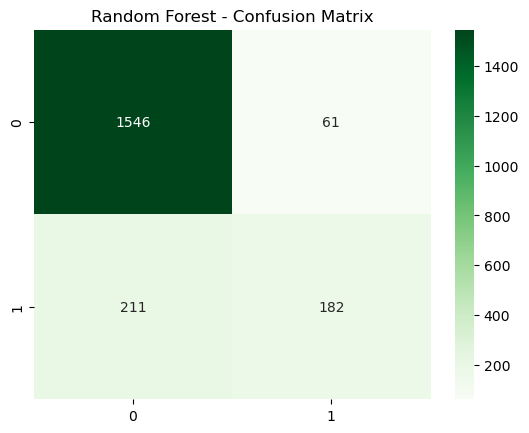

In [102]:
# Confusion Matrix
sns.heatmap(confusion_matrix(y_test, y_pred_rf), annot=True, fmt='d', cmap='Greens')
plt.title("Random Forest - Confusion Matrix")
plt.show()

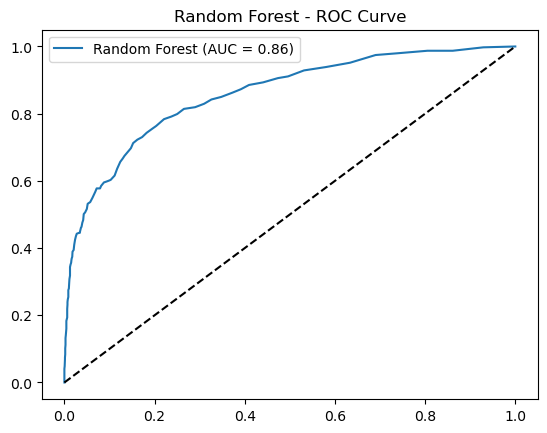

In [106]:
# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba_rf)
plt.plot(fpr, tpr, label='Random Forest (AUC = %.2f)' % roc_auc_score(y_test, y_proba_rf))
plt.plot([0, 1], [0, 1], 'k--')
plt.title("Random Forest - ROC Curve")
plt.legend()
plt.show()

# XGBoost Classifier

In [109]:
xgb_model = XGBClassifier(use_label_encoder=False, eval_metric='logloss')
xgb_model.fit(X_train, y_train)
y_pred_xgb = xgb_model.predict(X_test)
y_proba_xgb = xgb_model.predict_proba(X_test)[:, 1]

U:\Anaconda\Lib\site-packages\xgboost\training.py:183: UserWarning: [10:26:14] WARNING: C:\actions-runner\_work\xgboost\xgboost\src\learner.cc:738: 
Parameters: { "use_label_encoder" } are not used.

  bst.update(dtrain, iteration=i, fobj=obj)


In [111]:
# Evaluation
print("XGBoost Report:\n")
print(classification_report(y_test, y_pred_xgb))
print("ROC AUC Score:", roc_auc_score(y_test, y_proba_xgb))

XGBoost Report:

              precision    recall  f1-score   support

           0       0.90      0.95      0.92      1607
           1       0.72      0.55      0.63       393

    accuracy                           0.87      2000
   macro avg       0.81      0.75      0.77      2000
weighted avg       0.86      0.87      0.86      2000

ROC AUC Score: 0.8502306227050548


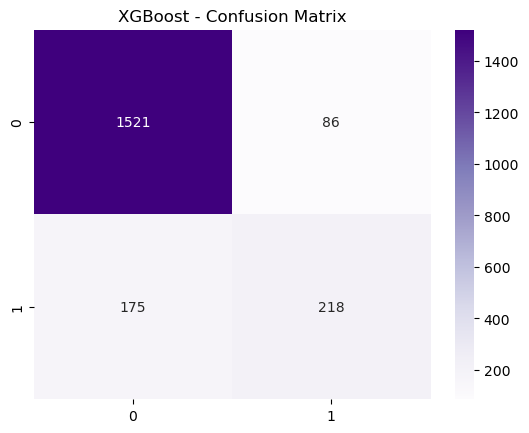

In [113]:
# Confusion Matrix
sns.heatmap(confusion_matrix(y_test, y_pred_xgb), annot=True, fmt='d', cmap='Purples')
plt.title("XGBoost - Confusion Matrix")
plt.show()

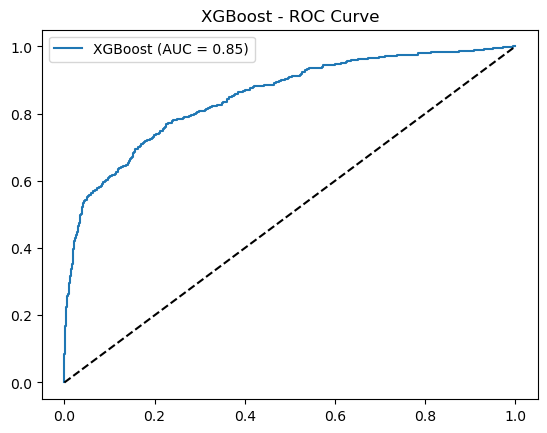

In [115]:
# ROC Curve
fpr, tpr, _ = roc_curve(y_test, y_proba_xgb)
plt.plot(fpr, tpr, label='XGBoost (AUC = %.2f)' % roc_auc_score(y_test, y_proba_xgb))
plt.plot([0, 1], [0, 1], 'k--')
plt.title("XGBoost - ROC Curve")
plt.legend()
plt.show()

# Summary

C:\Users\Mohd Umar\AppData\Local\Temp\ipykernel_14188\584642939.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=models, y=auc_scores, palette='Set2')


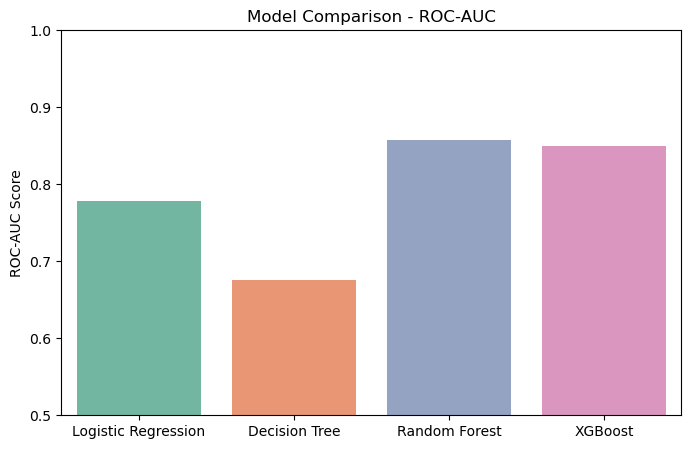

In [118]:
models = ['Logistic Regression', 'Decision Tree', 'Random Forest', 'XGBoost']
auc_scores = [
    roc_auc_score(y_test, y_proba_lr),
    roc_auc_score(y_test, y_proba_dt),
    roc_auc_score(y_test, y_proba_rf),
    roc_auc_score(y_test, y_proba_xgb)
]

plt.figure(figsize=(8, 5))
sns.barplot(x=models, y=auc_scores, palette='Set2')
plt.ylabel("ROC-AUC Score")
plt.title("Model Comparison - ROC-AUC")
plt.ylim(0.5, 1.0)
plt.show()


In [163]:
models = {
    "Logistic Regression": LogisticRegression(),
    "Decision Tree": DecisionTreeClassifier(),
    "Random Forest": RandomForestClassifier(),
    "XGBoost": XGBClassifier()
}

results = {}
for name, model in models.items():
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    results[name] = accuracy_score(y_test, y_pred)

# Print model performance
for model, acc in results.items():
    print(f"{model}: {acc:.4f}")

Logistic Regression: 0.8110
Decision Tree: 0.7825
Random Forest: 0.8660
XGBoost: 0.8695
